In [77]:
# imports & matplotlib options

import pyocr.builders
import pyocr
import pandas as pd
import numpy as np
import ipywidgets as widgets
import cv2
from shutil import copy
from pathlib import Path
from datetime import datetime
from collections import OrderedDict
import collections
import pytesseract
from autocorrect import spell
from fuzzywuzzy import fuzz, process
from ipywidgets import interact, IntProgress, Label, VBox
from IPython.display import display
from matplotlib import pyplot as plt
import img_qc.img_qc as img_qc
from skimage.measure import compare_ssim as ssim
from PIL import Image
%matplotlib inline

tools = pyocr.get_available_tools()
tool = tools[0]


plt.rc('figure', figsize=(30.0, 20.0))


print(f'\n{25 * "*_*"}\nLast run on {datetime.now().strftime("%Y-%m-%d %I:%M:%S %p")}')


*_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_*
Last run on 2019-08-23 09:24:29 AM


In [285]:
# functions
def bgr_imshow(bgr_image):
    bgr_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)
    plt.imshow(bgr_image)
    plt.show()


def create_crop_dictionary(data_dictionary, show_images=False):

    crop_dictionary = OrderedDict()
    # bgr_crop_dictionary = OrderedDict()
    # gray_crop_dictionary = OrderedDict()

    for title, data in data_dictionary.items():

        print(f'Processing {title} . . .')
        # print(data)

        if title not in crop_dictionary:  # instantiate empty OrderedDict
            crop_dictionary[title] = OrderedDict()
            # print(crop_dictionary)

        for sub_title, (adminDB, crop_box) in data.items():
            print(sub_title, adminDB, crop_box)
            # get image color, image_path, and crop box from sub_data
            colorspace = sub_title.split('_')[0]

            # print(colorspace)
            adminDB_ending = f'{str(adminDB).zfill(6)}_0001.tif'
            # print(adminDB_ending)
            try:
                image_path = [
                    x for x in page_1_paths_list if x.name.endswith(adminDB_ending)][0]
            except IndexError:  # no image match found
                print(f'No image for {title} - {sub_title}\n')
                continue

            x1, y1, x2, y2 = crop_box

            # load image and crop it
            image_for_title_crop = cv2.imread(str(image_path))
            title_crop = image_for_title_crop[y1:y2, x1:x2].copy()

            keypoints, descriptors = get_keypoints_and_descriptors(title_crop)

            # add cropped image to dictionaries
            # instantiate empty OrderedDict
            if sub_title not in crop_dictionary[title]:
                crop_dictionary[title][sub_title] = OrderedDict()
                crop_dictionary[title][sub_title] = title_crop, keypoints, descriptors

            # if colorspace == 'gray':  # then Grayscale
            #     if title not in gray_crop_dictionary:
            #         gray_crop_dictionary[title] = OrderedDict()
            #     if sub_title not in gray_crop_dictionary[title]:
            #         gray_crop_dictionary[title][sub_title] = title_crop
            #     cmap = 'gray'
            # else:  # then BGR
            #     if title not in bgr_crop_dictionary:
            #         bgr_crop_dictionary[title] = OrderedDict()
            #     if sub_title not in bgr_crop_dictionary[title]:
            #         bgr_crop_dictionary[title][sub_title] = title_crop
            #     title_crop = cv2.cvtColor(title_crop, cv2.COLOR_BGR2RGB)
            #     cmap = None

            if show_images:
                 bgr_imshow(title_crop)

    return crop_dictionary  # , gray_crop_dictionary, bgr_crop_dictionary


def crop_image_for_processing(image_path, percentage=0.4, top_and_sides_padding=10):

    # load image and get shape
    image = cv2.imread(str(image_path))
    height, width = image.shape[:2]

    # set (x, y) pairs
    x1, y1, x2, y2 = 0, 0, width, int(height * percentage)

    # add/subtract padding from the top/left/right
    x1 += top_and_sides_padding
    y1 += top_and_sides_padding
    x2 -= top_and_sides_padding
    # add image area to the bottom that was cropped from the top
    y2 += top_and_sides_padding

    # crop image
    image = image[y1:y2, x1:x2]

    return image


def draw_month_box(line_and_word_boxes, image):
    # draw month box on page
    filter_chars = 'abcdefghijklmnopqrstuvwxyz1234567890 '
    finding_month = True
    for line in line_and_word_boxes:
        # print(line.content)
        line_condensed = [x for x in line.content if x.lower() in filter_chars]
        string = ''
        text = string.join(line_condensed)
        # print(text)
        for word in text.split(' '):
            test_word = spell(word)
            if test_word:
                word = test_word
            if word.lower() in months and finding_month:
                month = word.lower()
                # print(line.position)
                for box in line.word_boxes:
                    if box.content.lower() == month:
                        # print(box.content)
                        # print(box.position)
                        (x1, y1), (x2, y2) = box.position[:2]
                        padding = 10
                        x1 -= padding
                        x2 += padding
                        y1 -= padding
                        y2 += padding
                        drawing = cv2.rectangle(
                            image.copy(), (x1, y1), (x2, y2), (255, 255, 0), 3)
                        drawing = cv2.cvtColor(drawing, cv2.COLOR_BGR2RGB)
                        plt.imshow(drawing), plt.show()
                        finding_month = False


def get_keypoints_and_descriptors(image):
    # convert to grayscale if necessary
    image_gray = if_rgb_convert_to_gray(image)

    # create SIFT object
    sift = cv2.xfeatures2d.SIFT_create()
    extractor = RootSIFT(sift)

    # find keypoints and descriptors with RootSIFT
    (keypoints, _) = sift.detectAndCompute(image_gray, None)
    keypoints, descriptors = extractor.compute(image_gray, keypoints)

    return keypoints, descriptors


# https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_feature_homography/py_feature_homography.html
def find_crop_rootSift(image_search_for, image_look_in, minimum_matches, distance_ratio):

    image_search_for = np.array(image_search_for)
    image_look_in = np.array(image_look_in)

    # convert to grayscale if necessary
    image_search_for_gray = if_rgb_convert_to_gray(image_search_for)
    image_look_in_gray = if_rgb_convert_to_gray(image_look_in)

    # equalize histogram of image we're looking in (already done for title crop)
    # image_look_in_gray = cv2.equalizeHist(image_look_in_gray)
    # image_search_for_gray = cv2.equalizeHist(image_search_for_gray)

    # create SIFT object
    sift = cv2.xfeatures2d.SIFT_create()
    extractor = RootSIFT(sift)

    # find keypoints and descriptors with SIFT
    (keypoints, _) = sift.detectAndCompute(image_search_for_gray, None)
    keypoints_1, descriptors_1 = extractor.compute(
        image_search_for_gray, keypoints)
    (keypoints, _) = sift.detectAndCompute(image_look_in_gray, None)
    keypoints_2, descriptors_2 = extractor.compute(
        image_look_in_gray, keypoints)

    FLANN_INDEX_KDTREE = 0
    index_parameters = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_parameters = dict(checks=50)

    flann = cv2.FlannBasedMatcher(index_parameters, search_parameters)

    matches = flann.knnMatch(descriptors_1, descriptors_2, k=2)

    good_matches = []
    for m, n in matches:
        if m.distance < distance_ratio * n.distance:
            good_matches.append(m)
    number_of_good_matches = len(good_matches)
    # print(f'before: {number_of_good_matches}')

    if number_of_good_matches >= minimum_matches:
        source_points = np.float32(
            [keypoints_1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
        destination_points = np.float32(
            [keypoints_2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

        matrix, mask = cv2.findHomography(
            source_points, destination_points, cv2.RANSAC, 5.0)
        if matrix is not None:

            matches_mask = mask.ravel().tolist()

            height, width = image_search_for_gray.shape
            points = np.float32(
                [[0, 0], [0, height-1], [width-1, height-1], [width-1, 0]]).reshape(-1, 1, 2)
            destination = cv2.perspectiveTransform(points, matrix)

            crop_box = np.int32(destination)

            match_drawing = image_look_in.copy()
            match_drawing = cv2.polylines(match_drawing, [np.int32(
                destination)], True, (255, 0, 0), 10, cv2.LINE_AA)

            # draw matches
            # draw_parameters = dict(
            #     matchColor = (0, 255, 0),
            #     singlePointColor = None,
            #     matchesMask = matches_mask,  # only draw inliers
            #     flags = 2  # don't draw single keypoints
            # )

            # matched_graphic = cv2.drawMatches(
            #     image_search_for,
            #     keypoints_1,
            #     match_drawing,
            #     keypoints_2,
            #     good_matches,
            #     None,
            #     **draw_parameters
            # )

            # crop found image
            perspective_matrix = cv2.getPerspectiveTransform(
                np.float32(destination), points)
            found_image = cv2.warpPerspective(
                image_look_in, perspective_matrix, (width, height))

            return number_of_good_matches, match_drawing, crop_box, found_image

        # print('')
        # print(f'{25 * "*"}')
        # print( "Not enough matches are found - {}/{}".format(len(good),minimum_matches))
        # print(f'{25 * "*"}')
        # print('')

    # return 0 for images if there weren't enough matches
    return number_of_good_matches, None, None, None


def get_best_match_per_title(image, crop_dictionary, distance_ratio):
    """crop_dictionary is nested set of OrderedDicts 3 levels deep
    the top 2 levels are the title and sub_title"""

    keypoints, descriptors = get_keypoints_and_descriptors(image)

    best_per_title_dict = OrderedDict()

    for title, data in crop_dictionary.items():

        if title not in best_per_title_dict:  # instantiate an OrderedDict()
            best_per_title_dict[title] = OrderedDict()  # number_of_matches, crop_box
            best_per_title_dict[title] = [0, False, False, False]
            print(title)

        for sub_title, sub_data in crop_dictionary[title].items():

            crop_image, crop_keypoints, crop_descriptors = sub_data
            # bgr_imshow(crop_image)

            number_of_matches, matches = get_descriptor_matches(
                crop_descriptors, descriptors, distance_ratio)
            print(sub_title)
            print(f'# of matches: {number_of_matches}')
            print(f'comparison value: {best_per_title_dict[title][0]}')

            if number_of_matches > best_per_title_dict[title][0]:  # then it might be the best match

                found_image, crop_box = get_matching_crop_and_box(
                        matches, crop_keypoints, keypoints, image)
                
                try:
                    if not crop_box:  # then we didn't get a valid crop_box
                        print(crop_box)
                        continue
                except ValueError:  # valid numpy array throws a ValueError when testing existence
                    best_per_title_dict[title] = [number_of_matches, crop_image, found_image, crop_box]

    return best_per_title_dict


def get_descriptor_matches(descriptors_1, descriptors_2, distance_ratio):

    # # load the image packages we're looking in and looking for, then convert to grayscale
    # image_search_for, keypoints_1, descriptors_1 = to_find_image_package
    # image_look_in, keypoints_2, descriptors_2 = find_in_image_package
    # image_search_for_gray = if_rgb_convert_to_gray(image_search_for)
    # image_look_in_gray = if_rgb_convert_to_gray(image_look_in)

    # match descriptors
    FLANN_INDEX_KDTREE = 0
    index_parameters = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_parameters = dict(checks=50)

    flann = cv2.FlannBasedMatcher(index_parameters, search_parameters)

    matches = flann.knnMatch(descriptors_1, descriptors_2, k=2)

    good_matches = []
    for m, n in matches:
        if m.distance < distance_ratio * n.distance:
            good_matches.append(m)
    number_of_good_matches = len(good_matches)

    return number_of_good_matches, good_matches


def get_matching_crop_and_box(matches, keypoints_to_find, keypoints_look_in, image_look_in):

    crop_image, found_image, crop_box = False, False, False

    source_points = np.float32(
        [keypoints_to_find[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    destination_points = np.float32(
        [keypoints_look_in[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    matrix, mask = cv2.findHomography(
        source_points, destination_points, cv2.RANSAC, 5.0)

    if matrix is not None:

        matches_mask = mask.ravel().tolist()

        height, width = image_look_in.shape[:2]
        points = np.float32(
            [[0, 0], [0, height-1], [width-1, height-1], [width-1, 0]]).reshape(-1, 1, 2)
        destination = cv2.perspectiveTransform(points, matrix)

        crop_box = np.float32(destination)

        # crop found image
        perspective_matrix = cv2.getPerspectiveTransform(
            np.float32(destination), points)
        found_image = cv2.warpPerspective(
            image_look_in, perspective_matrix, (width, height))
        # bgr_imshow(found_image)

    return found_image, crop_box


def get_np_crop_points(crop_box):
    x_points = []
    y_points = []
    print(f'crop box: {crop_box}')

    # append all x/y points to their respective lists
    for i in range(len(crop_box)):
        if crop_box[i][0][0] > 0:
            x_points.append(crop_box[i][0][0])
        if crop_box[i][0][1] > 0:
            y_points.append(crop_box[i][0][1])
    print('x/y points')
    print(x_points, y_points)

    # find extremes in crop box
    x1 = min(x_points)
    x2 = max(x_points)
    y1 = min(y_points)
    y2 = max(y_points)
    print(f'x1: {x1}, y1: {y1}, x2: {x2}, y2: {y2}')

    return x1, y1, x2, y2


def if_rgb_convert_to_gray(np_image):
    if len(np_image.shape) > 2:
        np_image = cv2.cvtColor(np_image, cv2.COLOR_RGB2GRAY)

    return np_image


def if_bgr_convert_to_gray(np_image):
    if len(np_image.shape) > 2:
        np_image = cv2.cvtColor(np_image, cv2.COLOR_BGR2GRAY)

    return np_image


def get_month_crop(image, ocr_df):

    ocr_df.dropna(subset=['text'], inplace=True)

    box = False
    month_crop = []
    date_crop = []
    month_line = 0
    month_word = 0

    # assume the first month we find is correct
    month_found = False
    # print(ocr_df)

    for index, row in enumerate(ocr_df.itertuples()):
        # print(f'row: {row}')
        text = row.text
        # print(index, text)
        if not month_found:
            if isinstance(text, float):
                pass
            else:
                # print(text)
                test_text = spell(text)
                if test_text:
                    text = test_text
                # print(text)
                if text.lower() in months:
                    # print(ocr_df.iloc[index])
                    box = []
                    for edge in roi_box_list:
                        # print(box)
                        # print(ocr_df.iloc[index][edge])
                        box.append(ocr_df.iloc[index][edge])
                    month_found = True
                    par_num = ocr_df.iloc[index]['par_num']
                    line_num = ocr_df.iloc[index]['line_num']
                    word_num = ocr_df.iloc[index]['word_num']
    # print(month_line, month_word)
    date_dataframe = ocr_df.loc[(ocr_df['par_num'] == par_num) & (
        ocr_df['line_num'] == line_num) & (ocr_df['word_num'] >= word_num)]
    # print(date_dataframe)
    date_dataframe = date_dataframe[[
        'par_num', 'line_num', 'word_num', 'left', 'top', 'width', 'height', 'text']]
    # print(date_dataframe)

    if not month_found:  # add all text into a single string and find closest match to a month
        # TO DO!
        pass

    if box:
        # print(box)
        box = [int(x) if x != box[0] else x for x in box]
        text, x1, y1, box_width, box_height = box
        x2 = x1 + box_width
        y2 = y1 + box_height

        # print(box)
        image_to_crop = cv2.imread(str(image_path))
        width, height = image_to_crop.shape[:2]
        month_crop = image_to_crop[y1:y2, x1:x2]
        # bgr_imshow(month_crop)

        # crop image and get date box based on finding the month
        # date_x1 = x1 - 30
        # date_x2 = x1 + 600
        # date_y1 = y1 - 30
        # date_y2 = y2 + 30
        # date_x1 = max(0, date_x1)
        # date_y1 = max(0, date_y1)
        # date_x2 = min(date_x2, width)
        # date_y2 = min(date_y2, height)

        # date_crop = image_to_crop[date_y1:date_y2, date_x1:date_x2]
        # bgr_imshow(date_crop)

    # return cropped images
    return month_crop, date_dataframe


def resize(image, width=None, height=None, ratio=None, inter=cv2.INTER_AREA):
    # initialize the dimensions of the image to be resized and
    # grab the image size
    dim = None
    (h, w) = image.shape[:2]

    # if both the width and height are None, then return the
    # original image
    if width is None and height is None:
        return image

    # check to see if the width is None
    if width is None:
        # calculate the ratio of the height and construct the
        # dimensions
        ratio = height / float(h)
        dim = (int(w * ratio), height)

    # otherwise, the height is None
    else:
        # calculate the ratio of the width and construct the
        # dimensions
        ratio = width / float(w)
        dim = (width, int(h * ratio))

    # resize the image
    resized = cv2.resize(image, dim, interpolation=inter)

    # return the resized image
    return resized, ratio


def resize_ratio(image, ratio, inter=cv2.INTER_AREA):
    dim = None
    (h, w) = image.shape[:2]
    dim = (int(w * ratio), int(h * ratio))

    # resize the image
    resized = cv2.resize(image, dim, interpolation=inter)

    # return the resized image
    return resized


print(f'\n{25 * "*_*"}\nLast run on {datetime.now().strftime("%Y-%m-%d %I:%M:%S %p")}')


*_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_*
Last run on 2019-08-23 01:01:22 PM


In [3]:
# lists
months = [
    'january',
    'february',
    'march',
    'april',
    'may',
    'june',
    'july',
    'august',
    'september',
    'october',
    'november',
    'december'
]

roi_box_list = ['text', 'left', 'top', 'width', 'height']

In [231]:
# feature descriptor
class RootSIFT:
    def __init__(self, extractor):
        # initialize the SIFT feature extractor
        self.extractor = extractor

    def compute(self, image, keypoints, epsilon=1e-7):
        # compute SIFT descriptors
        (keypoints, descriptors) = self.extractor.detectAndCompute(image, None)

        # if there are are no keypoints or descriptors
        if len(keypoints) == 0:
            # return an empty tuple
            return ([], None)

        # apply the Hellinger kernel by first L1-normalizing and taking the
        # square root
        descriptors /= (descriptors.sum(axis=1, keepdims=True) + epsilon)
        descriptors = np.sqrt(descriptors)

        # return a tuple of the keypoints and descriptors
        return (keypoints, descriptors)


print(f'\n{25 * "*_*"}\nLast run on {datetime.now().strftime("%Y-%m-%d %I:%M:%S %p")}')


*_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_*
Last run on 2019-08-23 12:28:46 PM


In [232]:
# create page 1 paths list
data_dir_path = Path('data/')
page_1_paths_list = sorted(data_dir_path.glob('images/*.tif'))

# delete macOS '.' index files
regenerate_paths_list = False
for path in page_1_paths_list:
    if path.name.startswith('.'):
        path.unlink()
        regenerate_paths_list = True

if regenerate_paths_list:
    page_1_paths_list = sorted(data_dir_path.glob('images/*.tif'))

print(f'{len(page_1_paths_list)} images in page 1 paths list')


print(f'\n{25 * "*_*"}\nLast run on {datetime.now().strftime("%Y-%m-%d %I:%M:%S %p")}')

413 images in page 1 paths list

*_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_*
Last run on 2019-08-23 12:28:47 PM


Processing Agricultural and home economics packet . . .
rgb_0 3295 (250, 450, 1450, 1150)


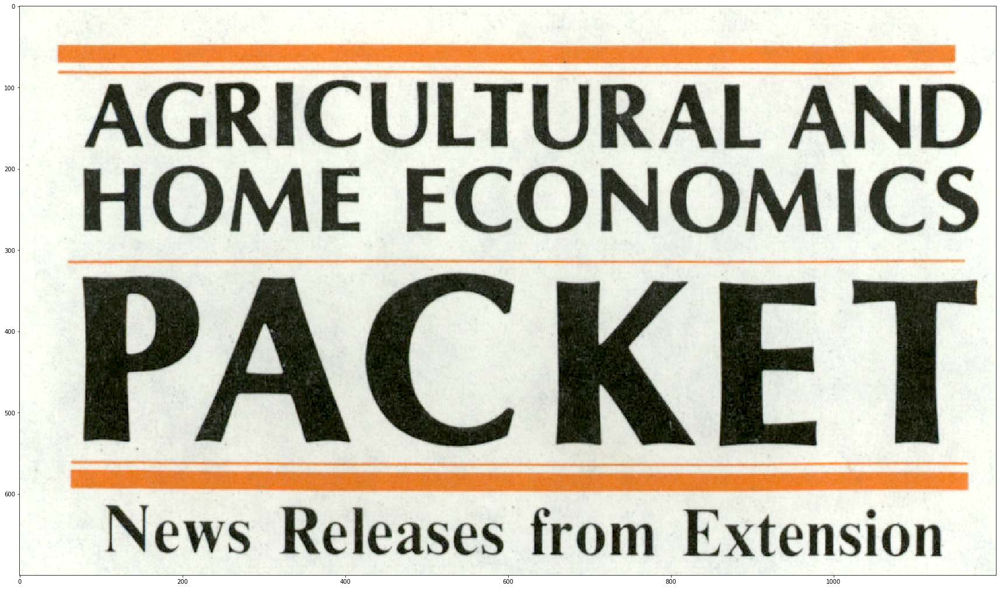

Processing Agricultural news . . .
rgb_0 3446 (1150, 50, 3200, 850)


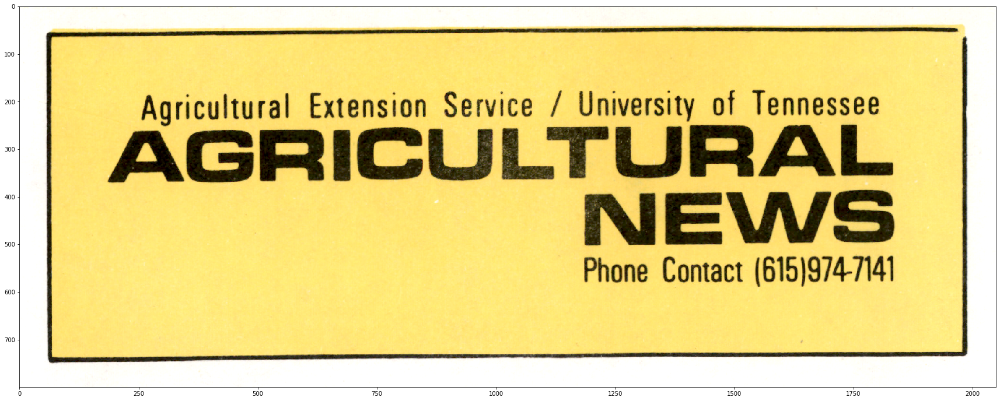

Processing Farm news . . .
gray_0 2364 (1400, 500, 2650, 875)


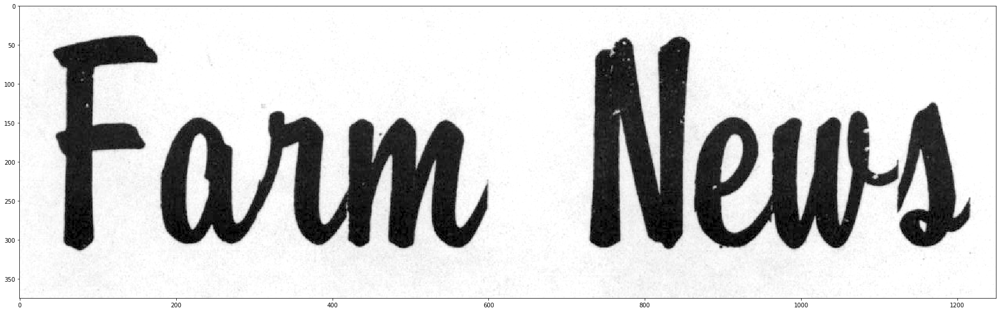

Processing Agricultural & home economics news . . .
rgb_0 2750 (1100, 50, 3150, 900)


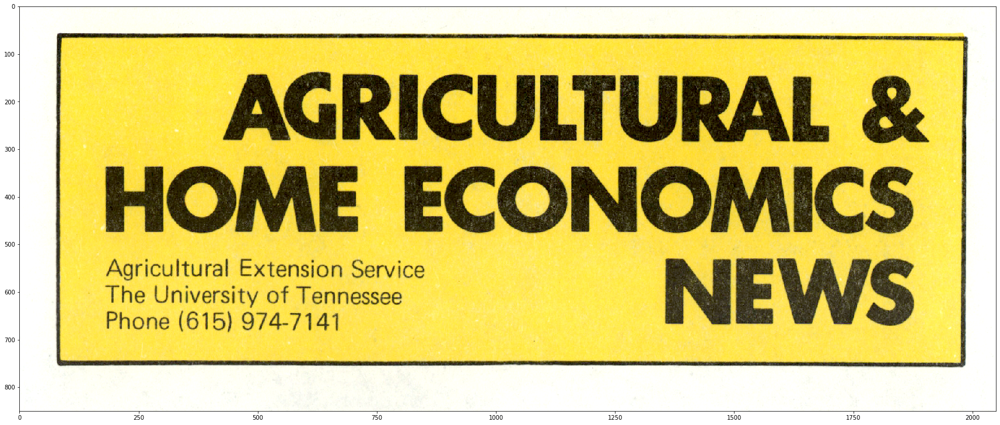

rgb_1 2951 (250, 500, 3050, 1100)


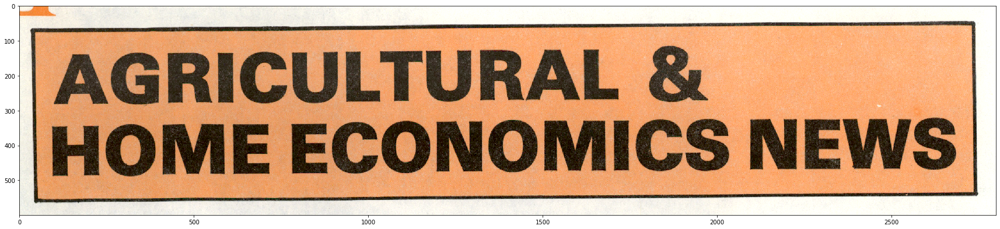

Processing Tennessee farm and home news . . .
gray_0 1670 (1400, 150, 3150, 300)


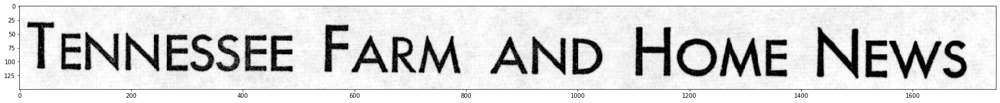

gray_1 964 (1400, 150, 3175, 290)


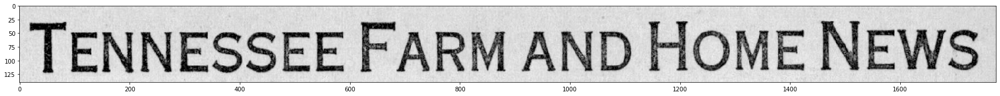

gray_2 2151 (1250, 150, 3025, 325)


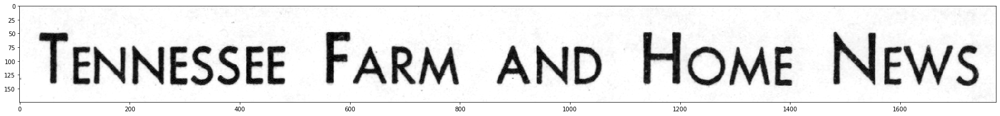

Processing Tennessee farm news . . .
gray_0 5 (725, 525, 2100, 750)


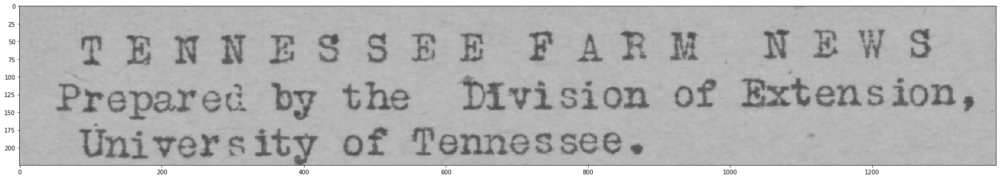

gray_1 15 (550, 600, 1950, 750)


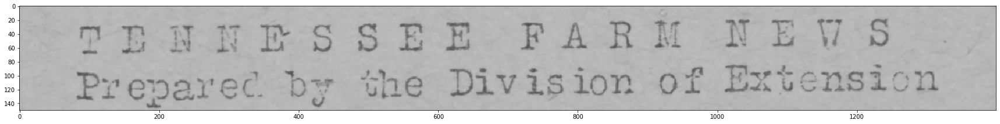

gray_2 456 (1000, 550, 2400, 675)


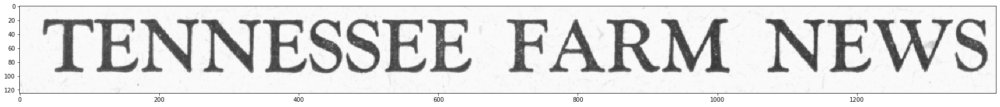

gray_3 254 (800, 500, 2200, 650)


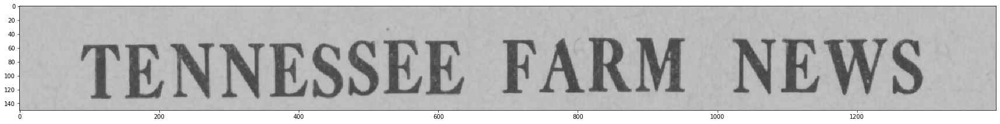

gray_4 44 (850, 475, 2250, 600)


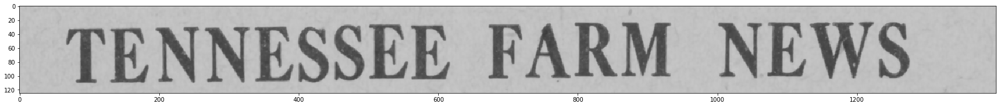


*_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_*
Last run on 2019-08-23 12:30:26 PM


In [237]:
# create title_crop_dict for title matching

# create OrderedDictionary for Title Crop data
title_data_ordered_dict = OrderedDict()
title_data_ordered_dict['Agricultural and home economics packet'] = OrderedDict(
    [('rgb_0', [3295, (250, 450, 1450, 1150)])])
title_data_ordered_dict['Agricultural news'] = OrderedDict(
    [('rgb_0', [3446, (1150, 50, 3200, 850)])])
title_data_ordered_dict['Farm news'] = OrderedDict(
    [('gray_0', [2364, (1400, 500, 2650, 875)])])
title_data_ordered_dict['Agricultural & home economics news'] = OrderedDict([
    ('rgb_0', [2750, (1100, 50, 3150, 900)]),
    ('rgb_1', [2951, (250, 500, 3050, 1100)])
])
title_data_ordered_dict['Tennessee farm and home news'] = OrderedDict([
    ('gray_0', [1670, (1400, 150, 3150, 300)]),
    ('gray_1', [964, (1400, 150, 3175, 290)]),
    ('gray_2', [2151, (1250, 150, 3025, 325)])
])
title_data_ordered_dict['Tennessee farm news'] = OrderedDict([
    ('gray_0', [5, (725, 525, 2100, 750)]),
    ('gray_1', [15, (550, 600, 1950, 750)]),
    ('gray_2', [456, (1000, 550, 2400, 675)]),
    ('gray_3', [254, (800, 500, 2200, 650)]),
    ('gray_4', [44, (850, 475, 2250, 600)])
])

# create title crop dictionary with OrderedDicts
title_crops_dict = create_crop_dictionary(
    title_data_ordered_dict, show_images=True)

print(f'\n{25 * "*_*"}\nLast run on {datetime.now().strftime("%Y-%m-%d %I:%M:%S %p")}')

In [49]:
# recursive getsizeof Object and all items contained in it
from sys import getsizeof


def get_size(obj, seen=None):
    """Recursively finds size of objects"""
    size = getsizeof(obj)
    if seen is None:
        seen = set()
    obj_id = id(obj)
    if obj_id in seen:
        return 0
    # Important mark as seen *before* entering recursion to gracefully handle
    # self-referential objects
    seen.add(obj_id)
    if isinstance(obj, dict):
        size += sum([get_size(v, seen) for v in obj.values()])
        size += sum([get_size(k, seen) for k in obj.keys()])
    elif hasattr(obj, '__dict__'):
        size += get_size(obj.__dict__, seen)
    elif hasattr(obj, '__iter__') and not isinstance(obj, (str, bytes, bytearray)):
        size += sum([get_size(i, seen) for i in obj])
    return size


print(
    f'title_crops_dict is {round(get_size(title_crops_dict)/1024/1024, 2)} megabytes')

title_crops_dict is 39.18 megabytes


In [286]:
class TnFarmNews:

    def __init__(self, image_path, config=False):

        # set config dictionary
        if config:
            self.config = config
        else:
            self.config = {'crop_percentage': 0.4,
                           'distance_ratio': 0.6,
                           'minimum_matches': 5,
                           'top_and_bottom_padding': 10,
                           'resize_width': 1500}

        # set variables
        self.MOST_MATCHES = self.config['minimum_matches']
        self.BEST_SSIM_WITH_TITLE = -1  # on a scale of -1->1, 1 is a perfect match
        self.BEST_TITLE_CROP = False
        self.BEST_TITLE = False
        self.RESIZE_RATIO = False

        # load image
        self.image_path = Path(image_path)
        self.image = cv2.imread(str(self.image_path))

        # get technical metadata
        self.height, self.width = self.image.shape[:2]
        if len(self.image.shape) > 2:
            self.colorspace = 'gray'
        else:
            self.colorspace = 'rgb'

        # crop image and get shape
        self.image_cropped = crop_image_for_processing(
            self.image_path, self.config['crop_percentage'], self.config['top_and_bottom_padding'])
        self.height_cropped, self.width_cropped = self.image_cropped.shape[:2]

        # resize image and get shape
    

    def guess_title(self, crop_dictionary, debug=True):

        print(f'Guessing title of {self.image_path.name} . . .')

        # resize cropped image and get features
        # if self.RESIZE_RATIO:
        #     image = resize_ratio(self.image_cropped, self.RESIZE_RATIO)
        # else:
        #     image, self.RESIZE_RATIO = resize(
        #         self.image_cropped, width=self.config['resize_width'])
        
        image = self.image_cropped

        best_match_per_title_dict = get_best_match_per_title(image, crop_dictionary, self.config['distance_ratio'])
            
        
        for title, data in best_match_per_title_dict.items():  # number_of_matches, found_image, crop_box
            number_of_matches, crop_image, found_image, crop_box = data
            if debug:
                print(f'{title}\n# of matches/minimum: {number_of_matches}/{self.MOST_MATCHES*0.5}\n')
            
            if number_of_matches >= (self.MOST_MATCHES * 0.5):

                x1, y1, x2, y2 = get_np_crop_points(crop_box)
                
                # x1 = int(x1 / self.RESIZE_RATIO)
                # y1 = int(y1 / self.RESIZE_RATIO)
                # x2 = int(x2 / self.RESIZE_RATIO)
                # y2 = int(y2 / self.RESIZE_RATIO)

                # if width/height of title isn't over min_title_width/height pixels
                # it's not the title
                min_title_width = 900
                min_title_height = 50
                title_width = x2 - x1
                title_height = y2 - y1
                
                crop = self.image_cropped[y1:y2, x1:x2]
                bgr_imshow(crop)
                
                if (x2 - x1 < min_title_width):
                    if debug:
                        print(f'\t\t\tFalse positive: width < minimum')
                        print(
                            f'\t\t\t\t{x2} - {x1} = {title_width} < {min_title_width}')
                    continue
                elif (y2 - y1 < min_title_height):
                    if debug:
                        print(f'\t\t\tFalse positive: height < minimum')
                        print(
                            f'\t\t\t\t{y2} - {y2} = {title_height} < {min_title_height}')
                    continue
                
                # convert to grayscale for ssim
                found_gray = if_bgr_convert_to_gray(found_image)
                crop_gray = if_bgr_convert_to_gray(crop_image)

                # get the structural similiarity index of the match with the image for a 2nd heuristic
                try:
                    ssim_value = ssim(found_gray, crop_gray)
                    print(title, ssim_value)
                    if ssim_value > self.BEST_SSIM_WITH_TITLE:
                        self.BEST_SSIM_WITH_TITLE = ssim_value
                        points = [x1, y1, x2, y2]
                        points = [int[x] for x in points]
                        self.BEST_TITLE_CROP = points
                        self.BEST_TITLE = title
                    
                except ValueError:  # image shape doesn't match, so most likely incorrect title
                    continue
                

                # crop_box = (x1, y1, x2, y2)
                # print(f'{y1}:{y2}, {x1}:{x2}')

#                     # get the structural similarity index of the match with the image for a 2nd heuristic
#                     np_found = if_bgr_convert_to_gray(found_image)
#                     np_title_crop = cv2.cvtColor(
#                         np.array(title_crop), cv2.COLOR_BGR2GRAY)

#                     try:
#                         ssim_with_title = ssim(
#                             np_title_crop, np_found, multichannel=True)

#                         if debug:
#                             print(f'\t\tssim: {ssim_with_title}')

#                         if ssim_with_title > self.best_ssim_with_title:

#                             self.best_ssim_with_title = ssim_with_title
#                             self.best_found_image = found_image
#                             best_matched_drawing = match_drawing

#                             self.most_matches = number_of_matches

#                             # np_found_title_crop = self.image_cropped[y1:y2, x1:x2]
#                             # self.best_title_crop = np_found_title_crop

#                             self.best_crop_box = (x1 - self.top_and_bottom_padding,
#                                                   y1 - self.top_and_bottom_padding,
#                                                   x2,
#                                                   y2 + self.top_and_bottom_padding)

#                             self.best_title = title

#                     except ValueError:  # image shape doesn't match, so most likely incorrect title
#                         if debug:
#                             print(f"\t\t\tFalse positive: image shapes don't match")
#                         continue

#             if self.best_title:
#                 if self.best_title.startswith('Agricultural & home economics news_'):
#                     self.best_title = 'Agricultural & home economics news'
#                 elif self.best_title.startswith('Tennessee farm and home news_'):
#                     self.best_title = 'Tennessee farm and home news'
#                 elif self.best_title.startswith('Tennessee farm news_'):
#                     self.best_title = 'Tennessee farm news'

    def ocr(self):

        image = cv2.cvtColor(self.image_cropped, cv2.COLOR_BGR2GRAY)

        # blur image
        image = cv2.GaussianBlur(image, (3, 3), 1)

        # binarize
        self.binarized = cv2.adaptiveThreshold(
            image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 175, 21)

        # ocr
        self.line_and_word_boxes = tool.image_to_string(
            Image.fromarray(self.binarized),
            lang='eng',
            builder=pyocr.builders.LineBoxBuilder(),
        )


print(f'\n{25 * "*_*"}\nLast run on {datetime.now().strftime("%Y-%m-%d %I:%M:%S %p")}')


*_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_**_*
Last run on 2019-08-23 01:01:25 PM


`your_df == “some_value”` : This will create a boolean mask of your whole DataFrame. If you want to search for directly in a column, use `df[‘your_column_name’]`. If you want to search on multiple columns, do `df[ [‘column_1’, ‘column_n’] ]`. For indexes, use either `df.loc[]` or `df.iloc[]`.
Having a boolean array, you shall now use the method `.any()` on your newly created DataFrame, such as : `masked_df.any()`. This will return if any on the whole DataFrame has matched. But you can also specify if you want to make a search by column (`.any(axis=1)`), or row (`.any(axis=0)`).

In [287]:
rows_list = []

paths_list = page_1_paths_list[17:]
number_of_paths = len(paths_list)

# progress bar
progress_label = Label('Images to process')
progress_bar = IntProgress(min=0, max=number_of_paths)
progress_widget = VBox([progress_label, progress_bar])
display(progress_widget)



for index, image_path in enumerate(paths_list, start=1):
    
    if len(crop_df) > 0:
        if (crop_df['image_path'] == image_path).any():
            continue

    label = f'Processing {image_path.name} . . . {index}/{number_of_paths}'
    progress_label.value = label

    issue = TnFarmNews(image_path)
    # issue.ocr()
    # draw_month_box(issue.line_and_word_boxes, issue.image_cropped)
    issue.guess_title(title_crops_dict, debug=True)
    print(f'\t{issue.BEST_TITLE}')

    # get input row in dictionary format
    # key = column_name
    results_dictionary = {'image_path': issue.image_path,
                          'title_guess': issue.BEST_TITLE,
                          'title_crop': issue.BEST_TITLE_CROP}

    for key in results_dictionary:
        if results_dictionary[key]:
            continue
        else:
            results_dictionary.update({key: None})

    rows_list.append(results_dictionary)

    progress_bar.value = index

Guessing title of 0012_004266_000142_0001.tif . . .
Agricultural and home economics packet
rgb_0
# of matches: 5
comparison value: 0
False
Agricultural news
rgb_0
# of matches: 0
comparison value: 0
Farm news
gray_0
# of matches: 0
comparison value: 0
Agricultural & home economics news
rgb_0
# of matches: 3
comparison value: 0
False
rgb_1
# of matches: 2
comparison value: 0
False
Tennessee farm and home news
gray_0
# of matches: 0
comparison value: 0
gray_1
# of matches: 1
comparison value: 0
False
gray_2
# of matches: 3
comparison value: 0
False
Tennessee farm news
gray_0
# of matches: 1
comparison value: 0
False
gray_1
# of matches: 1
comparison value: 0
False
gray_2
# of matches: 4
comparison value: 0
gray_3
# of matches: 54
comparison value: 4
gray_4
# of matches: 63
comparison value: 54
Agricultural and home economics packet
# of matches/minimum: 0/2.5

Agricultural news
# of matches/minimum: 0/2.5

Farm news
# of matches/minimum: 0/2.5

Agricultural & home economics news
# of mat

TypeError: slice indices must be integers or None or have an __index__ method

In [206]:
rows_list

[{'image_path': PosixPath('data/images/0012_004266_000107_0001.tif'),
  'title_guess': None,
  'title_crop': None},
 {'image_path': PosixPath('data/images/0012_004266_000108_0001.tif'),
  'title_guess': None,
  'title_crop': None},
 {'image_path': PosixPath('data/images/0012_004266_000115_0001.tif'),
  'title_guess': None,
  'title_crop': None},
 {'image_path': PosixPath('data/images/0012_004266_000128_0001.tif'),
  'title_guess': None,
  'title_crop': None},
 {'image_path': PosixPath('data/images/0012_004266_000129_0001.tif'),
  'title_guess': None,
  'title_crop': None},
 {'image_path': PosixPath('data/images/0012_004266_000136_0001.tif'),
  'title_guess': None,
  'title_crop': None},
 {'image_path': PosixPath('data/images/0012_004266_000137_0001.tif'),
  'title_guess': None,
  'title_crop': None}]

In [207]:
crop_df = pd.DataFrame(rows_list)
crop_df

,image_path,title_crop,title_guess
0,data/images/0012_004266_000107_0001.tif,None,None
1,data/images/0012_004266_000108_0001.tif,None,None
2,data/images/0012_004266_000115_0001.tif,None,None
3,data/images/0012_004266_000128_0001.tif,None,None
4,data/images/0012_004266_000129_0001.tif,None,None
5,data/images/0012_004266_000136_0001.tif,None,None
6,data/images/0012_004266_000137_0001.tif,None,None


In [197]:
crop_df['image_path'].tolist()

[PosixPath('data/images/0012_004266_000107_0001.tif')]

In [ ]:
image_path = crop_df['image_path'][0]
image = cv2.imread(str(image_path))
x1, y1, x2, y2 = crop_df['title_crop'][0]
image_cropped = image[y1:y2, x1:x2]
plt.imshow(image), plt.show()
plt.imshow(image_cropped), plt.show()

In [ ]:
@interact
def show_images(file=page_1_paths_list):
    # load image
    issue = TnFarmNews(file)
    issue.ocr()
    # draw_month_box(issue.line_and_word_boxes, issue.image_cropped)
    # image = Image.open(file)
    # temp_image_path = Path('_temp_image.jpg')
    # image.save(temp_image_path)
    # display(ipyImage(temp_image_path))
    issue.guess_title(title_crops_dict, debug=True)
    print(issue.best_title)

In [ ]:
# this is my attempt to try and make a crop-value widget!

page_1_paths_dictionary = {path.name: path for path in page_1_paths_list}
initial_path = page_1_paths_list[0]
initial_images_key = initial_path.name
initial_image = cv2.imread(image)
initial_x2 =

# Create widgets
images = widgets.Dropdown(
    options=page_1_paths_dictionary, value=initial_path_key)
crop_x1 = widgets.IntRangeSlider(value=(100, , min=0, max=initial_image.shape[1])
crop_y1=widgets.IntSlider(value=0, min=0, max=initial_image.shape[0])
crop_x2=widgets.IntSlider()

# Updates the image options based on directory value
def update_crop(*args):
    crop_x1.max=os.listdir(directory.value)

# Tie the image options to directory value
directory.observe(update_crop, 'value')

# Show the images
def show_images(fdir, file):
    display(Image(f'{fdir}/{file}'))

_=interact(show_images, fdir=directory, file=images)
def crop_image(file=page_1_paths_list, x1=(0, Image.open(file).size[0])):
    # load image
    issue=TnFarmNews(file)
    issue.ocr()
    draw_month_box(issue.line_and_word_boxes, issue.image_cropped)
    # image = Image.open(file)
    # temp_image_path = Path('_temp_image.jpg')
    # image.save(temp_image_path)
    # display(ipyImage(temp_image_path))
    issue.guess_title(debug=True)
    print(issue.best_title)